In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
from scipy.stats import zscore
import warnings
warnings.filterwarnings('ignore')

**features **

Pregnancies: Number of pregnancies (for a woman)

Glucose: Blood glucose level after a glucose tolerance test.

BloodPressure: Blood pressure (mmHg).

SkinThickness: Skin thickness (mm).

Insulin: Blood insulin level (mu U/ml).

BMI: Body Mass Index.

DiabetesPedigreeFunction: A function expressing the family history of diabetes.

Age: Age (in years).

Outcome: The outcome (0 or 1) where 1 means the person has diabetes and 0 means they don't.

# **Pandas Profiling**

In [2]:
pip install ydata-profiling

In [3]:
from ydata_profiling import ProfileReport

In [4]:
db = pd.read_csv('/content/diabetes.csv')

In [5]:
profile = ProfileReport(db, title='Pandas Profiling Report')
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
db.head(10).style.background_gradient(cmap='Reds')

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.600000,0.627000,50,1
1,1,85,66,29,0,26.600000,0.351000,31,0
2,8,183,64,0,0,23.300000,0.672000,32,1
3,1,89,66,23,94,28.100000,0.167000,21,0
4,0,137,40,35,168,43.100000,2.288000,33,1
5,5,116,74,0,0,25.600000,0.201000,30,0
6,3,78,50,32,88,31.000000,0.248000,26,1
7,10,115,0,0,0,35.300000,0.134000,29,0
8,2,197,70,45,543,30.500000,0.158000,53,1
9,8,125,96,0,0,0.000000,0.232000,54,1


In [7]:
db.tail().style.background_gradient(cmap='Reds')

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
764,2,122,70,27,0,36.800000,0.340000,27,0
765,5,121,72,23,112,26.200000,0.245000,30,0
766,1,126,60,0,0,30.100000,0.349000,47,1
767,1,93,70,31,0,30.400000,0.315000,23,0
768,0,123,77,0,1,36.300000,0.252000,55,1


In [8]:
db.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 769 entries, 0 to 768
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               769 non-null    int64  
 1   Glucose                   769 non-null    int64  
 2   BloodPressure             769 non-null    int64  
 3   SkinThickness             769 non-null    int64  
 4   Insulin                   769 non-null    int64  
 5   BMI                       769 non-null    float64
 6   DiabetesPedigreeFunction  769 non-null    float64
 7   Age                       769 non-null    int64  
 8   Outcome                   769 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.2 KB


In [9]:
db.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,769.000000,769.000000,769.000000,769.000000,769.000000,769.000000,769.000000,769.000000,769.000000
mean,3.840052,120.897269,69.115735,20.509753,79.697009,31.998179,0.471590,33.269181,0.349805
std,3.370237,31.951886,19.345296,15.959020,115.203999,7.880557,0.331208,11.778737,0.477219
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.244000,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,29.000000,32.000000,0.371000,29.000000,0.000000
75%,6.000000,140.000000,80.000000,32.000000,127.000000,36.600000,0.626000,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


In [10]:
db.shape

(769, 9)

In [11]:
db.isnull().sum()

,0
Pregnancies,0
Glucose,0
BloodPressure,0
SkinThickness,0
Insulin,0
BMI,0
DiabetesPedigreeFunction,0
Age,0
Outcome,0


**some insights**

**all collumns contain zeros and it's incorrect but the zero in columns Pregnancies and Outcome has a meaning so will replace these values in other columns using the median value**


In [12]:
# at first replace zeros with nan
db['Glucose'] = db['Glucose'].replace(0, np.nan)
db['BloodPressure'] = db['BloodPressure'].replace(0, np.nan)
db['SkinThickness'] = db['SkinThickness'].replace(0, np.nan)
db['Insulin'] = db['Insulin'].replace(0, np.nan)
db['BMI'] = db['BMI'].replace(0, np.nan)
db['Age'] = db['Age'].replace(0, np.nan)

In [13]:
db.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 769 entries, 0 to 768
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               769 non-null    int64  
 1   Glucose                   764 non-null    float64
 2   BloodPressure             734 non-null    float64
 3   SkinThickness             541 non-null    float64
 4   Insulin                   395 non-null    float64
 5   BMI                       758 non-null    float64
 6   DiabetesPedigreeFunction  769 non-null    float64
 7   Age                       769 non-null    int64  
 8   Outcome                   769 non-null    int64  
dtypes: float64(6), int64(3)
memory usage: 54.2 KB


In [14]:
# Check the percentage of nulls in each column
db.isna().mean().round(2) * 100

,0
Pregnancies,0.0
Glucose,1.0
BloodPressure,5.0
SkinThickness,30.0
Insulin,49.0
BMI,1.0
DiabetesPedigreeFunction,0.0
Age,0.0
Outcome,0.0


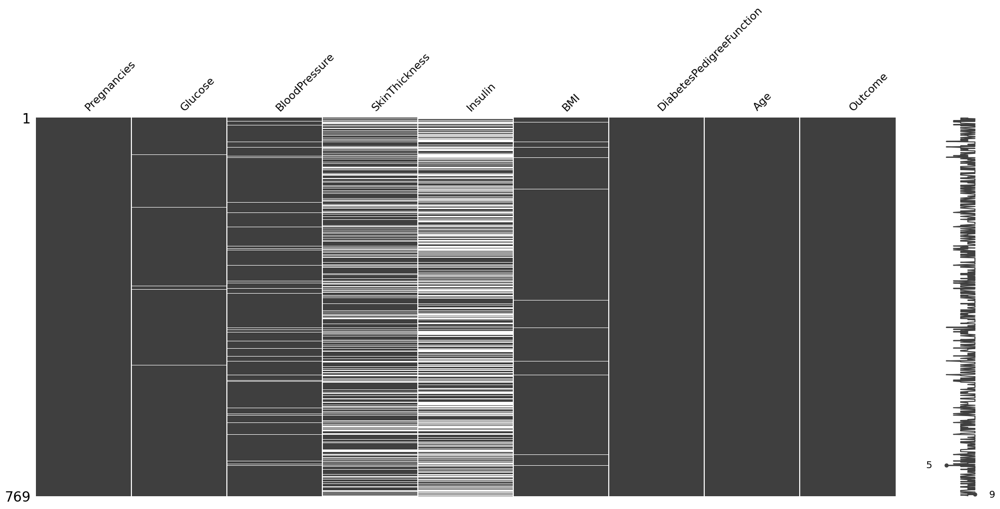

In [15]:
msno.matrix(db)
plt.show()


**we found that we have 5 columns contain nulls Glucose,BloodPressure, SkinThickness, Insulin and BMI**


In [16]:
# count all row contain nulls from all data
db.isnull().any(axis=1).sum()

377

***Function to replace nulls with median***

In [17]:
def replace_na_median (db, columns):
    for column in columns:
        median_val = db[column].median()
        db[column] = db[column].fillna(median_val)
    return db

columns = ['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI']
db = replace_na_median(db, columns)

In [18]:
db.isna().sum()

,0
Pregnancies,0
Glucose,0
BloodPressure,0
SkinThickness,0
Insulin,0
BMI,0
DiabetesPedigreeFunction,0
Age,0
Outcome,0


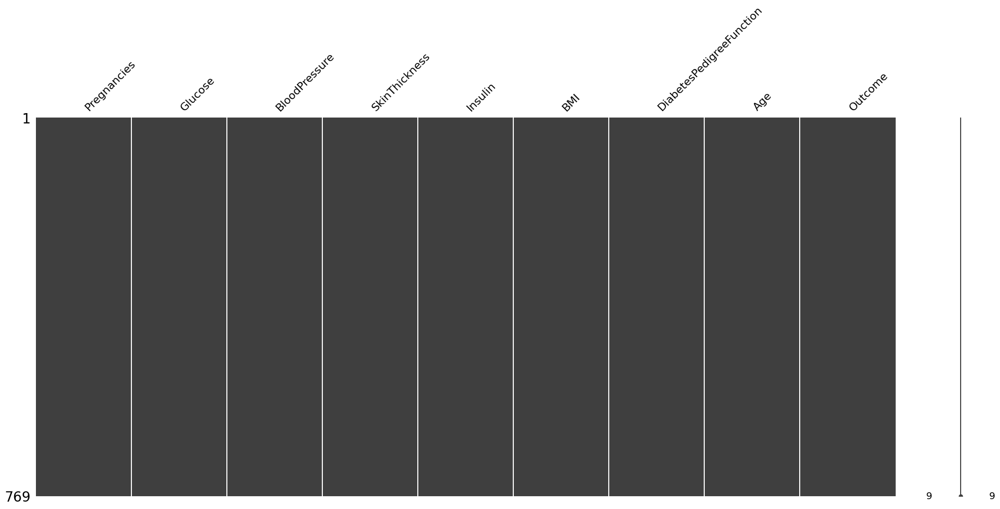

In [19]:
msno.matrix(db)
plt.show()

# **Dealing with duplicated data**

data doesn't contain duplicates

In [20]:
db.duplicated().sum()

0

# **Detect and handleing outliers******

**I will use zscore to detect outliers**

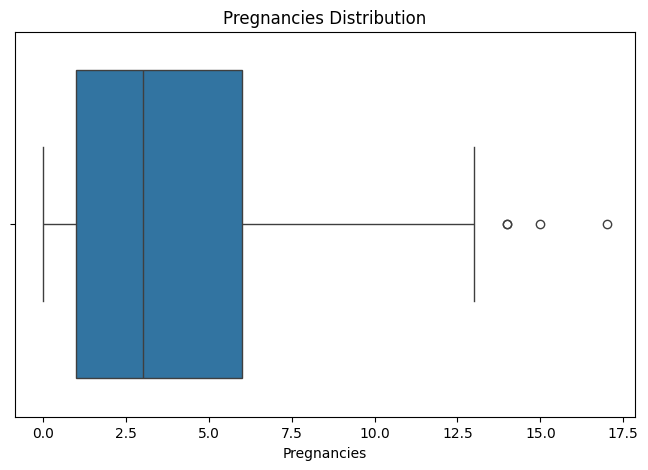

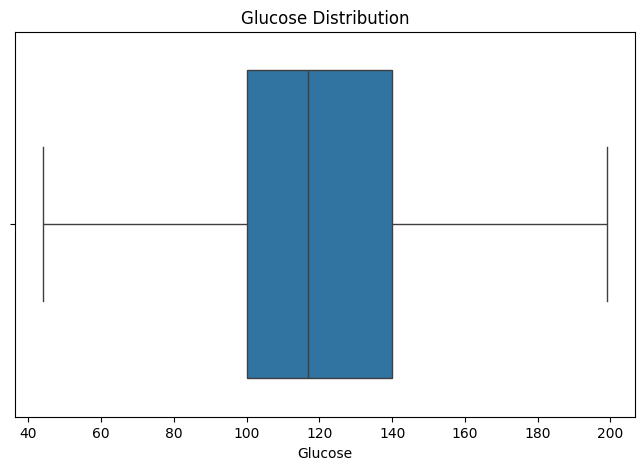

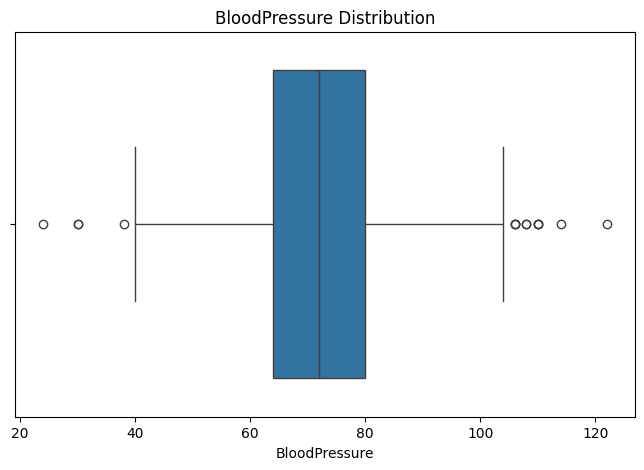

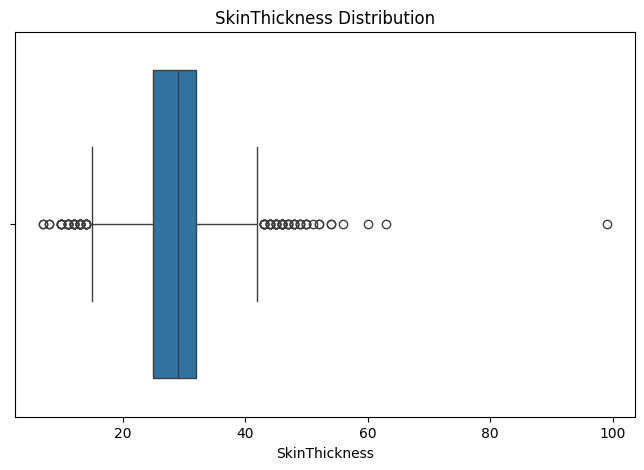

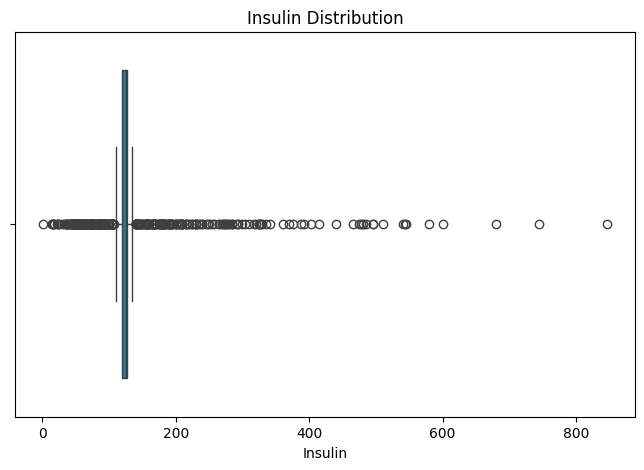

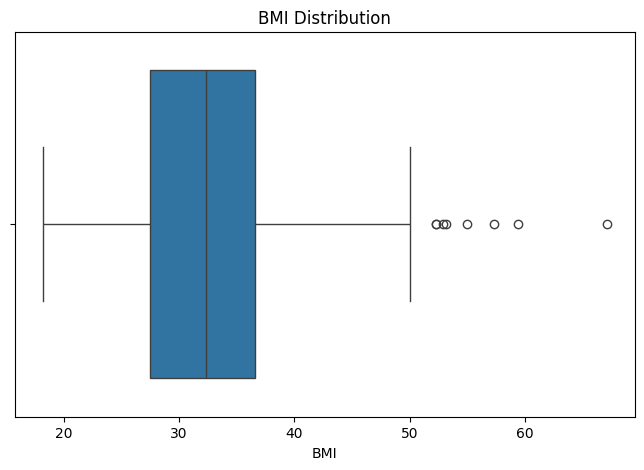

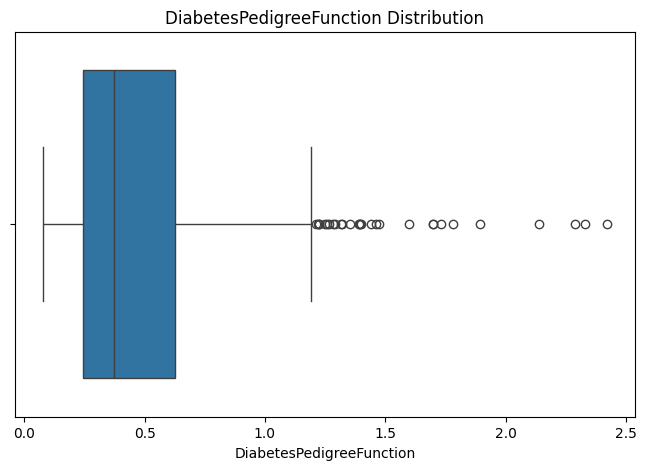

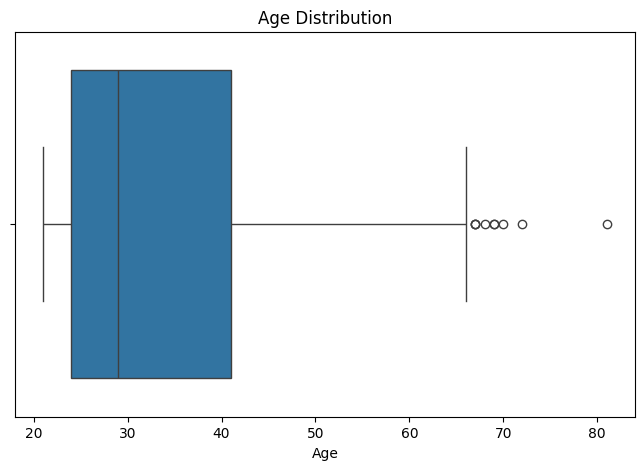

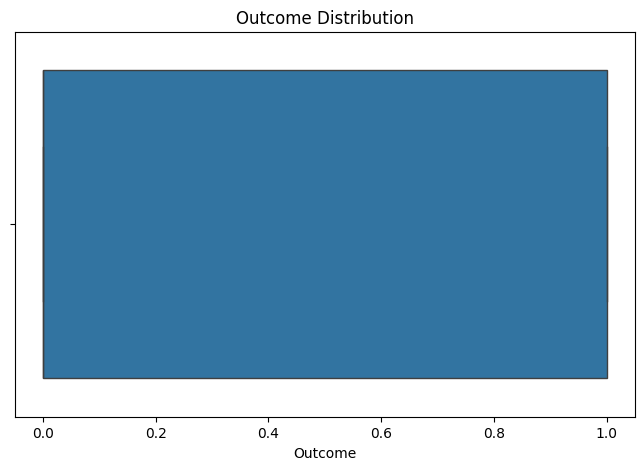

In [21]:
def draw_box(db, columns):

    for col in columns:
        # Check if the column is numeric
        if pd.api.types.is_numeric_dtype(db[col]):
            plt.figure(figsize=(8, 5))
            sns.boxplot(x=db[col]).set(title=f'{col} Distribution')
            plt.show()
        else:
            print(f"Skipping non-numeric column: {col}")

# Example usage
draw_box(db, db.columns)

**using zscore to detect outliers**

A z-score indicates how many standard deviations a data point is from the mean of the dataset.

How to determine z-score? To find the z-score, subtract the mean from the quantity in question, and then divide by the standard deviation of the whole set

In [33]:
def outliers_detection_and_median_modify(dp, columns):

    for column in dp.columns:
        if pd.api.types.is_numeric_dtype(db[column]):
            db[f'{column}_zscore'] = zscore(db[column])
            # Get the boolean mask for outliers
            outliers_mask = (db[f'{column}_zscore'] > 3) | (db[f'{column}_zscore'] < -3)

            # Get the outliers DataFrame (for information only - not used for modification)
            column_outliers = db[outliers_mask].drop(columns=[f'{column}_zscore'])

            # Calculate the median of the column
            median_value = db[column].median()

            # Replace outliers with the median value using the mask
            db.loc[outliers_mask, column] = median_value

        else:
            print(f"skip non numeric data:{column}")

    # Now you have a variable 'column_outliers' if you want to separately store the outliers
    return column_outliers #return statement not required as column_outliers is only for information in this case

outliers_detection_and_median_modify(db, db.columns)

skip non numeric data:AgeGroup


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome,AgeGroup,Pregnancies_zscore,Glucose_zscore,BloodPressure_zscore,SkinThickness_zscore,Insulin_zscore,BMI_zscore,DiabetesPedigreeFunction_zscore,Age_zscore,Outcome_zscore
88,3,136.0,70.0,32.0,110.0,37.1,0.153,43,1,40-50,3.313479,0.471796,-0.198039,0.329401,-0.352825,0.675603,-0.962531,0.826672,1.363355
159,3,163.0,72.0,41.0,114.0,40.9,0.817,47,1,40-50,3.907296,1.359992,-0.032504,1.354483,-0.306538,1.228924,1.043558,1.166488,1.363355
298,3,100.0,78.0,25.0,184.0,36.6,0.412,46,1,40-50,3.016571,-0.712464,0.464100,-0.467885,0.503484,0.602798,-0.180036,1.081534,1.363355
455,3,175.0,62.0,30.0,125.0,33.6,0.212,38,1,30-40,3.016571,1.754745,-0.860179,0.101605,-0.179249,0.165966,-0.784279,0.401902,1.363355


In [37]:
db.drop(columns=['Glucose_zscore', 'BloodPressure_zscore', 'SkinThickness_zscore', 'Insulin_zscore', 'BMI_zscore'], inplace=True)

KeyError: "['Glucose_zscore', 'BloodPressure_zscore', 'SkinThickness_zscore', 'Insulin_zscore', 'BMI_zscore'] not found in axis"

In [39]:
db.drop(columns=['Pregnancies_zscore', 'DiabetesPedigreeFunction_zscore', 'Age_zscore',
       'Outcome_zscore', 'Pregnancies_zscore_zscore'], inplace=True)

In [40]:
db.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome', 'AgeGroup'],
      dtype='object')

In [41]:
db.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome,AgeGroup
0,6,148.0,72.0,35.0,125.0,33.6,0.627,50,1,40-50
1,1,85.0,66.0,29.0,125.0,26.6,0.351,31,0,30-40
2,8,183.0,64.0,29.0,125.0,23.3,0.672,32,1,30-40
3,1,89.0,66.0,23.0,94.0,28.1,0.167,21,0,20-30
4,0,137.0,40.0,35.0,168.0,43.1,0.371,33,1,30-40


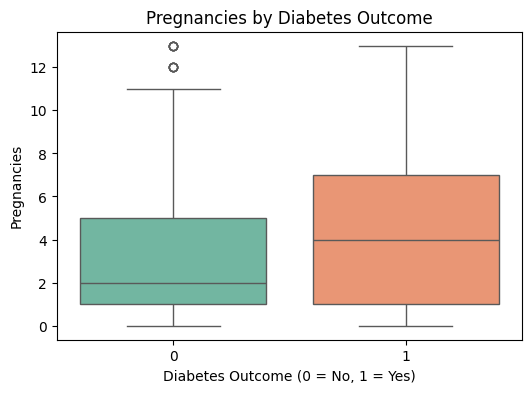

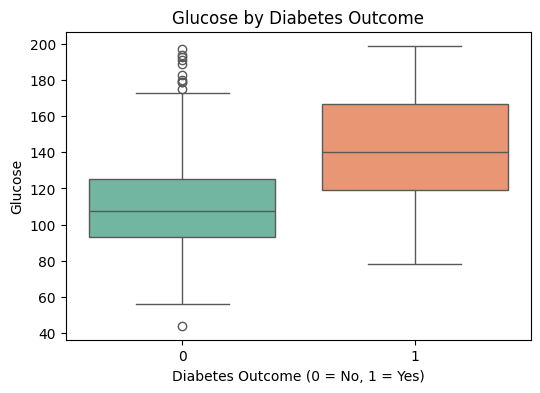

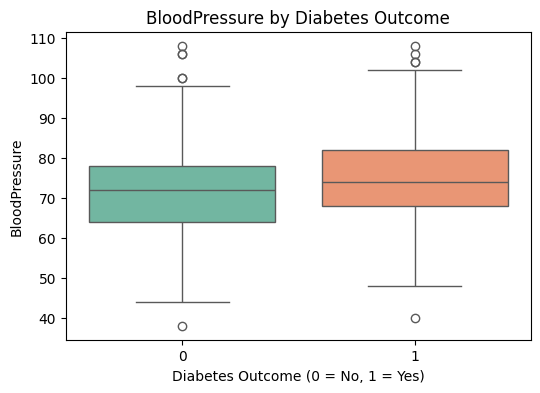

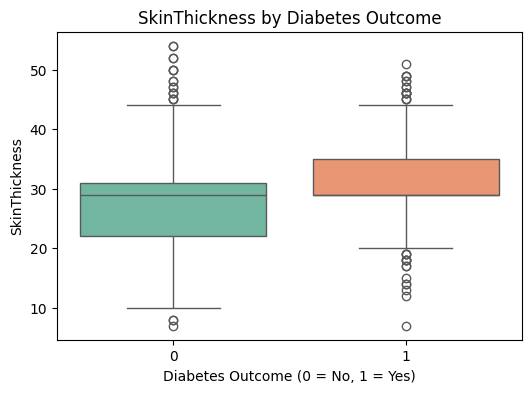

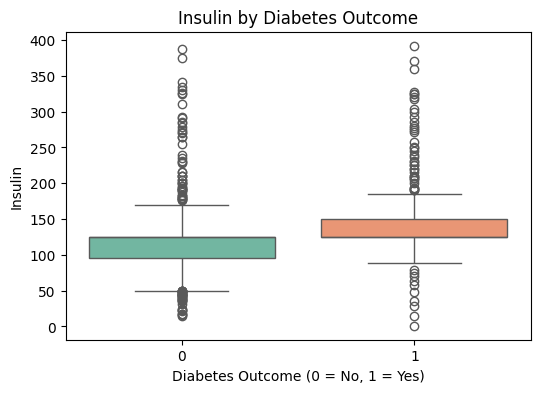

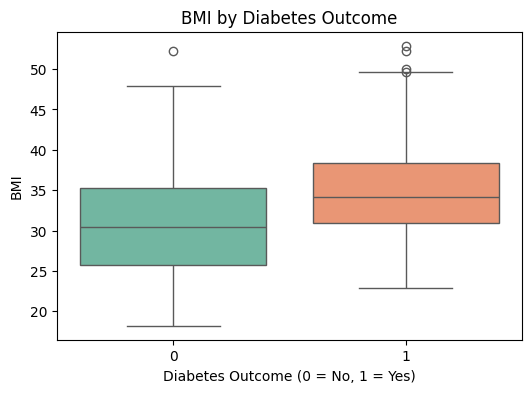

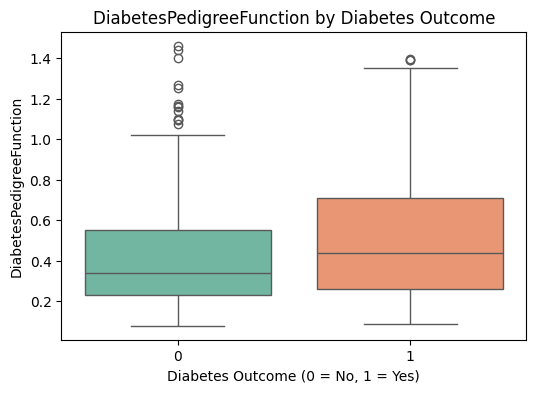

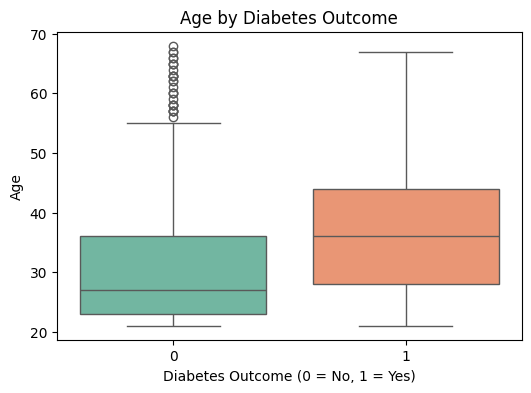

In [58]:
# List of columns to visualize (excluding 'Outcome')
columns_to_plot = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']

# Create boxplots for each column
for column in columns_to_plot:
    plt.figure(figsize=(6, 4))  # Set figure size for each plot
    sns.boxplot(x='Outcome', y=column, data=db, palette='Set2')
    plt.title(f'{column} by Diabetes Outcome')
    plt.xlabel('Diabetes Outcome (0 = No, 1 = Yes)')
    plt.ylabel(column)
    plt.show()

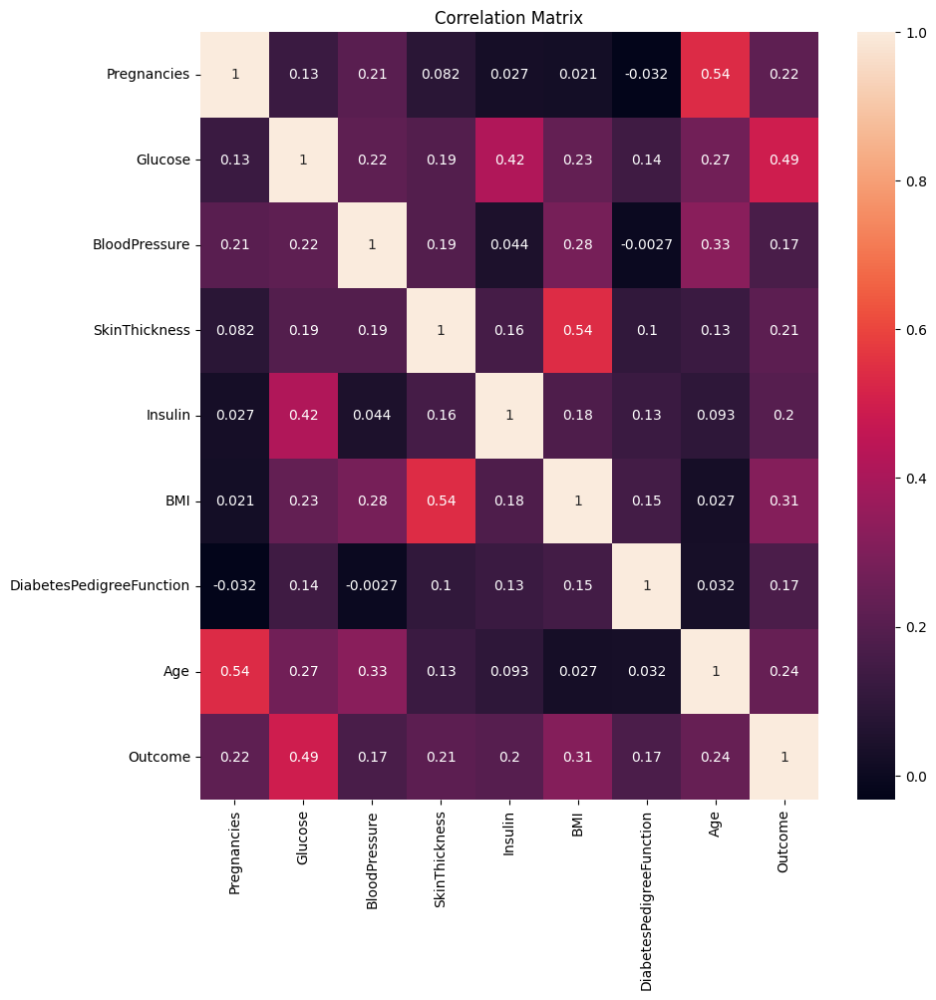

In [26]:
corr = db.corr()

plt.figure(figsize=(10,10))
sns.heatmap(corr, annot=True)
plt.title('Correlation Matrix')
plt.show()

**What is the distribution of the Outcome variable (diabetic vs. non-diabetic)?**

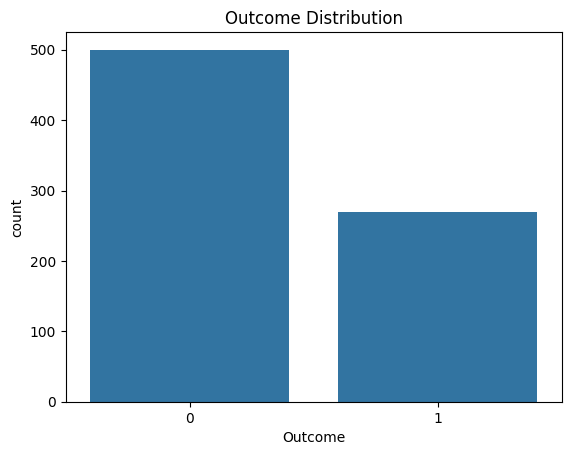

In [59]:

sns.countplot(x='Outcome', data=db)
plt.title('Outcome Distribution')
plt.show()

**Patients age distributions**

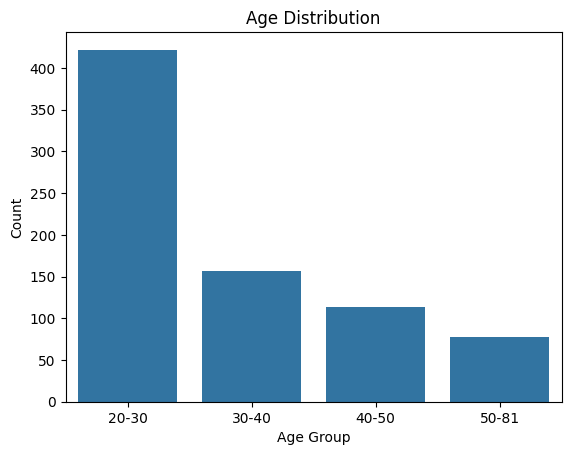

In [60]:
db['AgeGroup'] = pd.cut(db['Age'], bins= [20, 30, 40, 50, 81], labels=['20-30', '30-40', '40-50', '50-81'])

sns.countplot(x='AgeGroup', data=db)
plt.title('Age Distribution')
plt.xlabel('Age Group')
plt.ylabel('Count')
plt.show()

**Age vs Glucose Level**

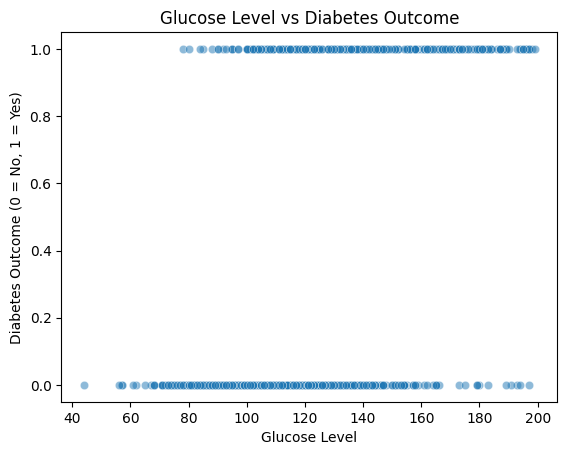

In [61]:
# Scatter plot for Glucose vs Outcome

sns.scatterplot(x='Glucose', y='Outcome', data=db, alpha=0.5)
plt.title('Glucose Level vs Diabetes Outcome')
plt.xlabel('Glucose Level')
plt.ylabel('Diabetes Outcome (0 = No, 1 = Yes)')
plt.show()

**What is the distribution of BMI for diabetic and non-diabetic individuals?**

Text(0.5, 0, 'BMI')

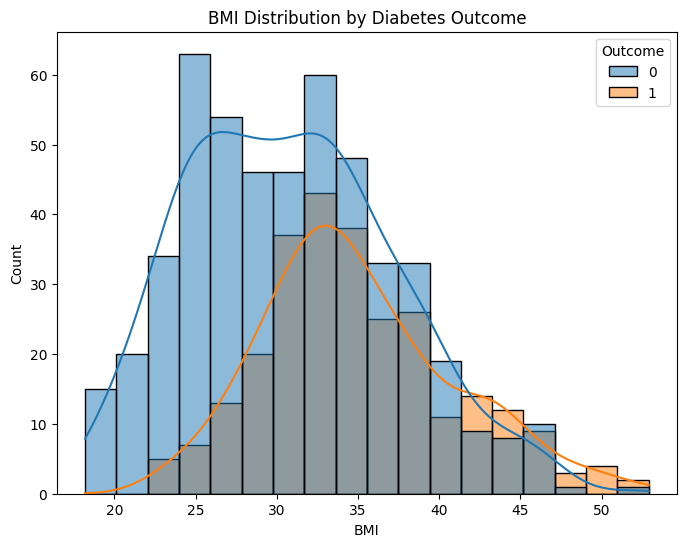

In [49]:
plt.figure(figsize=(8,6))
sns.histplot(data=db, x='BMI', hue='Outcome', kde=True)
plt.title('BMI Distribution by Diabetes Outcome')
plt.xlabel('BMI')

**Relation Between Insulin and Glucose**

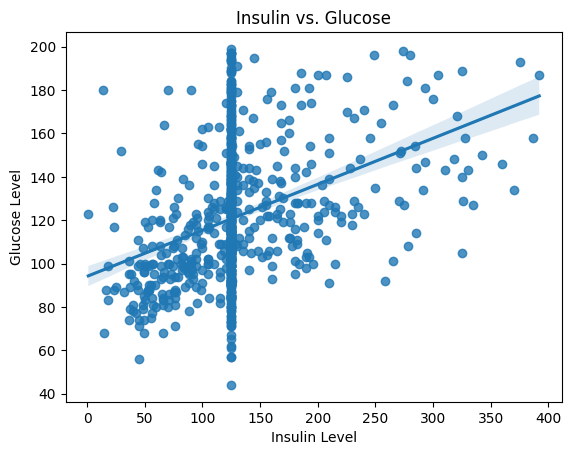

In [53]:
sns.regplot(x='Insulin', y='Glucose', data=db)
plt.title('Insulin vs. Glucose')
plt.xlabel('Insulin Level')
plt.ylabel('Glucose Level')
plt.show()
# positive linear regression

**How does the number of Pregnancies affect the likelihood of diabetes?**

Text(0.5, 0, 'Number of Pregnancies')

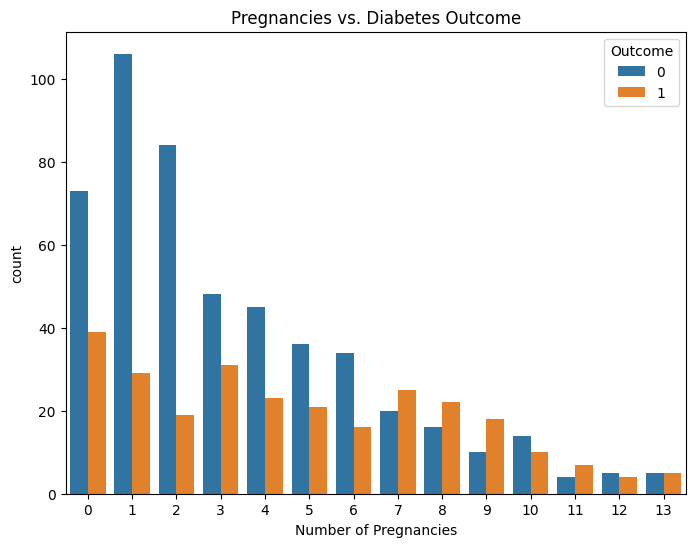

In [54]:
plt.figure(figsize=(8,6))
sns.countplot(x='Pregnancies', hue='Outcome', data=db)
plt.title('Pregnancies vs. Diabetes Outcome')
plt.xlabel('Number of Pregnancies')

 **What is the distribution of DiabetesPedigreeFunction for diabetic and non-diabetic individuals?**

Text(0.5, 0, 'DiabetesPedigreeFunction')

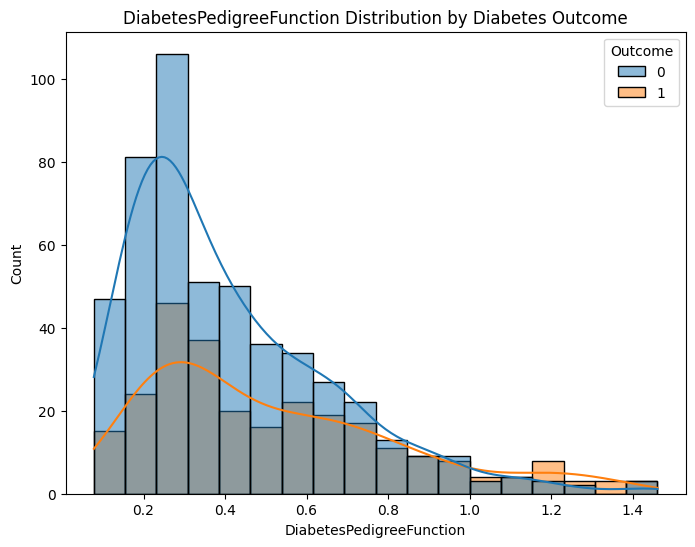

In [57]:
plt.figure(figsize=(8,6))
sns.histplot(data=db, x='DiabetesPedigreeFunction', hue='Outcome', kde=True)
plt.title('DiabetesPedigreeFunction Distribution by Diabetes Outcome')
plt.xlabel('DiabetesPedigreeFunction')

**the data contain more insight i wish i found more**